# Préparation du dataset

## Import du dataset

In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import os
from os import listdir
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, auc, roc_auc_score, roc_curve
from glob import glob

import keras
import tensorflow as tf
from keras.models import Model, Sequential
from keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout 
from keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.utils import load_img, img_to_array
from keras.utils import to_categorical

In [139]:
path = "../Images/"
list_photos = [file for file in listdir(path)]
print(len(list_photos))

# Create DataFrame with image data
df = pd.read_csv('../../cleaned.csv')

1049


In [140]:
import re

s = df['product_category_tree']

# Extraire le deuxième ensemble de mots
second_set = s.str.split('>>').str[0].str.strip()

second_set.value_counts()

["Home Furnishing               150
["Baby Care                     150
["Watches                       150
["Home Decor & Festive Needs    150
["Kitchen & Dining              150
["Beauty and Personal Care      150
["Computers                     150
Name: product_category_tree, dtype: int64

In [141]:
df['product_category_tree'] = second_set
df["product_category_tree"] = df["product_category_tree"].str.replace('[', '', regex=True)
df["product_category_tree"] = df["product_category_tree"].str.replace('"', '', regex=True)

In [142]:
df.rename(columns={"product_category_tree": "category"}, inplace=True)
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,category,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,CRNEG7BKMFFYHQ8Z,1899.0,899.0,"[""http://img6a.flixcart.com/image/curtain/q/8/...",False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,Baby Care,BTWEGFZHGBXPHZUH,600.0,449.0,"[""http://img6a.flixcart.com/image/bath-towel/z...",False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,Baby Care,BTWEG6SHXTDB2A2Y,NaN,NaN,"[""http://img5a.flixcart.com/image/bath-towel/a...",False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,BDSEJT9UQWHDUBH4,2699.0,1299.0,"[""http://img6a.flixcart.com/image/bedsheet/d/r...",False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,BDSEJTHNGWVGWWQU,2599.0,698.0,"[""http://img6a.flixcart.com/image/bedsheet/w/q...",False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


## Création des labels des photos à partir du nom des images

In [143]:
from sklearn import preprocessing

def photo_class(row) :
    file_name = row['uniq_id'] + ".jpg"
    if file_name in list_photos:
        return row['category']
    
df=df.sort_values(by='uniq_id') 
df=df.reset_index()
data = pd.DataFrame()
data["image_path"] = list_photos
data["label_name"] = df.apply(photo_class, axis=1)
le = preprocessing.LabelEncoder()
data["label"] = le.fit_transform(data["label_name"])
data.head()

,image_path,label_name,label
0,009099b1f6e1e8f893ec29a7023153c4.jpg,Watches,6
1,0096e89cc25a8b96fb9808716406fe94.jpg,Kitchen & Dining,5
2,00cbbc837d340fa163d11e169fbdb952.jpg,Home Furnishing,4
3,00d84a518e0550612fcfcba3b02b6255.jpg,Beauty and Personal Care,1
4,00e966a5049a262cfc72e6bbf68b80e7.jpg,Computers,2


In [144]:
data.groupby("label").count()

,image_path,label_name
label,,
0,150,150
1,150,150
2,148,148
3,150,150
4,150,150
5,150,150
6,150,150
7,1,0


## Affichage d'exemples d'images par label

Watches


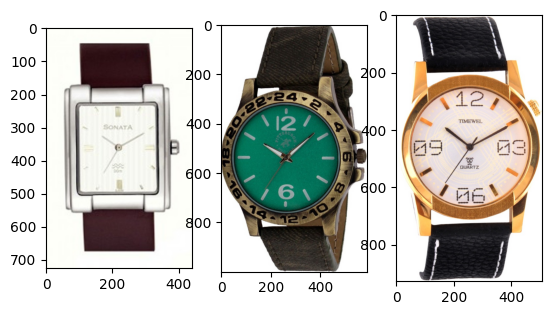

Kitchen & Dining


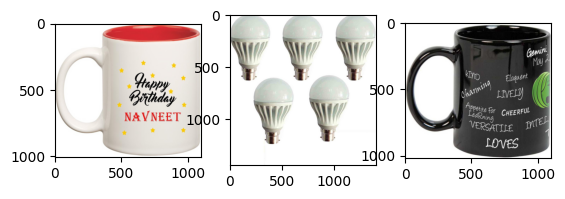

Home Furnishing


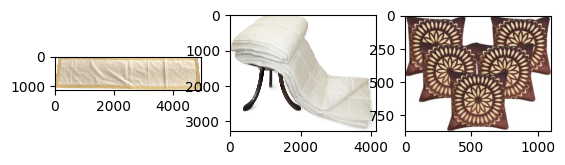

Beauty and Personal Care


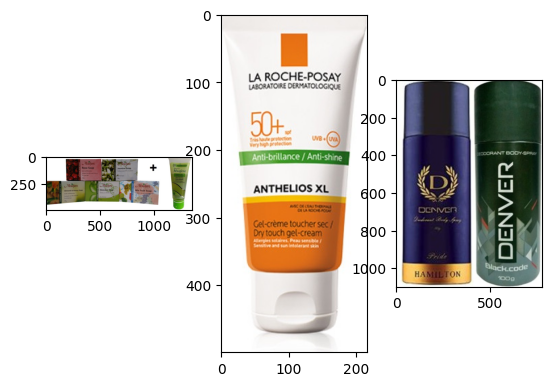

Computers


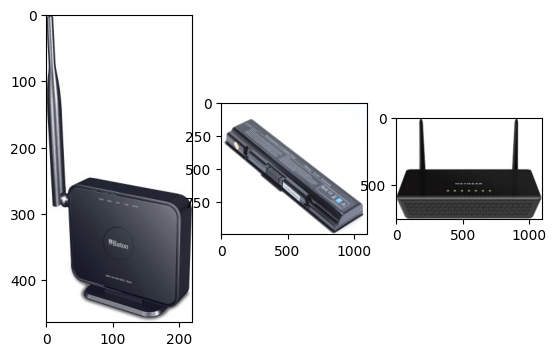

In [ ]:
from matplotlib.image import imread

list_labels = ["Watches", "Kitchen & Dining","Home Furnishing","Beauty and Personal Care","Computers"]

def list_fct(name) :
    list_image_name = [list_photos[i] for i in range(len(data)) if data["label_name"][i]==name]
    return list_image_name

list_cloudy=[list_photos[i] for i in range(len(data)) if data["label_name"][i]=="Watches"]
list_rain=[list_photos[i] for i in range(len(data)) if data["label_name"][i]=="Kitchen & Dining"]
list_shine=[list_photos[i] for i in range(len(data)) if data["label_name"][i]=="Home Furnishing	"]
list_sunrise=[list_photos[i] for i in range(len(data)) if data["label_name"][i]=="Beauty and Personal Care"]
list_sunrise=[list_photos[i] for i in range(len(data)) if data["label_name"][i]=="Computers"]

for name in list_labels :
    print(name)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(name)[i+10]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

## Détermination et affichage des descripteurs SIFT

* L'image contient 319 descripteurs
* Chaque descripteur est un vecteur de longueur 128

In [ ]:
pip install opencv-python

  Using cached opencv_python-4.7.0.72-cp37-abi3-win_amd64.whl (38.2 MB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip install opencv-contrib-python


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



     ---------------------------------------- 44.9/44.9 MB 9.5 MB/s eta 0:00:00


In [ ]:
pip list

Package                       Version
----------------------------- --------------------
absl-py                       1.4.0
adal                          1.2.7
aiofiles                      23.1.0
aiohttp                       3.8.4
aiokafka                      0.8.0
aiosignal                     1.3.1
alabaster                     0.7.12
alembic                       1.9.2
anaconda-client               1.11.0
anaconda-navigator            2.3.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argcomplete                   2.0.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.2
astroid                       2.11.7
astropy                       5.1
astunparse                    1.6.3
async-generator               1.10
async-timeout                 4.0.2
atomicwrites                  1.4.0
attrs                         21.4.0
Automat                       20.2.0
autop


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import cv2

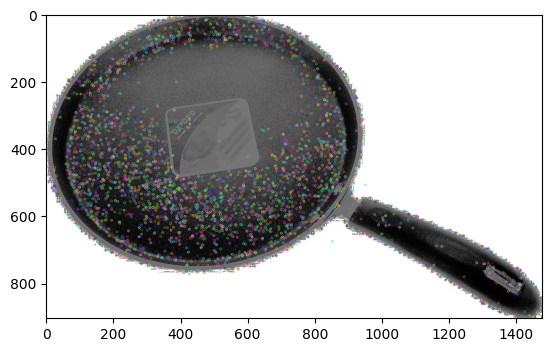

Descripteurs :  (4656, 128)

[[ 4.  2.  6. ...  5.  0.  0.]
 [96. 20.  0. ...  9.  2.  0.]
 [55. 16.  0. ...  0.  1.  0.]
 ...
 [12.  0.  0. ...  0.  0.  0.]
 [67. 19.  5. ...  0. 34. 13.]
 [ 0.  5. 27. ...  0.  0.  0.]]


In [ ]:
import cv2

sift =  cv2.SIFT_create()
image = cv2.imread(path+list_photos[1],0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)


# Pré-traitement des images via SIFT

## Créations des descripteurs de chaque image
* Pour chaque image passage en gris et equalisation
* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [ ]:
# identification of key points and associated descriptors
import time, cv2
sift_keypoints = []
temps1=time.time()
sift = cv2.SIFT_create(500)

for image_num in range(len(list_photos)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)

sift_keypoints_by_img = np.asarray(sift_keypoints)
sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000


C:\Users\utilisateur\AppData\Local\Temp\ipykernel_14560\3880497225.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  sift_keypoints_by_img = np.asarray(sift_keypoints)



Nombre de descripteurs :  (517351, 128)
temps de traitement SIFT descriptor :           592.34 secondes


## Création des clusters de descripteurs
* Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [ ]:

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
k

719

In [ ]:
pd.DataFrame(sift_keypoints_all).isnull().sum().sort_values(ascending = False)[0:30]

0     0
1     0
94    0
93    0
92    0
91    0
90    0
89    0
88    0
87    0
86    0
85    0
84    0
83    0
82    0
81    0
80    0
79    0
78    0
77    0
76    0
75    0
74    0
73    0
72    0
71    0
70    0
69    0
68    0
67    0
dtype: int64

In [ ]:
pip install --upgrade threadpoolctl


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip list

Package                       Version
----------------------------- --------------------
absl-py                       1.4.0
adal                          1.2.7
aiofiles                      23.1.0
aiohttp                       3.8.4
aiokafka                      0.8.0
aiosignal                     1.3.1
alabaster                     0.7.12
alembic                       1.9.2
anaconda-client               1.11.0
anaconda-navigator            2.3.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argcomplete                   2.0.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.2
astroid                       2.11.7
astropy                       5.1
astunparse                    1.6.3
async-generator               1.10
async-timeout                 4.0.2
atomicwrites                  1.4.0
attrs                         21.4.0
Automat                       20.2.0
autop


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip install numpy === 1.21.4

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '==='

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip list

Package                       Version
----------------------------- --------------------
absl-py                       1.4.0
adal                          1.2.7
aiofiles                      23.1.0
aiohttp                       3.8.4
aiokafka                      0.8.0
aiosignal                     1.3.1
alabaster                     0.7.12
alembic                       1.9.2
anaconda-client               1.11.0
anaconda-navigator            2.3.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argcomplete                   2.0.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.2
astroid                       2.11.7
astropy                       5.1
astunparse                    1.6.3
async-generator               1.10
async-timeout                 4.0.2
atomicwrites                  1.4.0
attrs                         21.4.0
Automat                       20.2.0
autop


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip install numpy==1.21.4

     --------------------------------------- 14.0/14.0 MB 10.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.6.0 requires daal==2021.4.0, which is not installed.
tensorflow-intel 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.21.4 which is incompatible.

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip list

Package                       Version
----------------------------- --------------------
absl-py                       1.4.0
adal                          1.2.7
aiofiles                      23.1.0
aiohttp                       3.8.4
aiokafka                      0.8.0
aiosignal                     1.3.1
alabaster                     0.7.12
alembic                       1.9.2
anaconda-client               1.11.0
anaconda-navigator            2.3.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argcomplete                   2.0.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.2
astroid                       2.11.7
astropy                       5.1
astunparse                    1.6.3
async-generator               1.10
async-timeout                 4.0.2
atomicwrites                  1.4.0
attrs                         21.4.0
Automat                       20.2.0
autop


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
sift_keypoints_all

array([[ 8.,  8., 10., ...,  4.,  1.,  3.],
       [ 0., 10., 49., ...,  0.,  0.,  1.],
       [10., 11.,  5., ...,  1.,  0.,  0.],
       ...,
       [47., 11.,  4., ...,  1.,  1., 27.],
       [ 8., 14., 17., ...,  0.,  0.,  2.],
       [80., 77.,  0., ...,  6.,  1.,  5.]], dtype=float32)

In [ ]:
a = pd.DataFrame(sift_keypoints_all)
a[a.notnull()]

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,8.0,8.0,10.0,4.0,0.0,0.0,79.0,94.0,4.0,3.0,...,0.0,17.0,15.0,15.0,30.0,83.0,36.0,4.0,1.0,3.0
1,0.0,10.0,49.0,7.0,0.0,0.0,0.0,0.0,0.0,10.0,...,19.0,61.0,6.0,23.0,91.0,9.0,0.0,0.0,0.0,1.0
2,10.0,11.0,5.0,2.0,1.0,2.0,38.0,105.0,3.0,5.0,...,1.0,2.0,39.0,63.0,16.0,46.0,28.0,1.0,0.0,0.0
3,3.0,31.0,107.0,37.0,16.0,26.0,5.0,3.0,25.0,83.0,...,1.0,22.0,53.0,25.0,14.0,30.0,14.0,10.0,12.0,41.0
4,13.0,23.0,11.0,4.0,28.0,130.0,9.0,3.0,48.0,47.0,...,10.0,14.0,2.0,3.0,17.0,91.0,16.0,6.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517346,0.0,22.0,44.0,34.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,11.0,100.0,109.0,23.0,0.0,1.0,3.0,3.0
517347,45.0,2.0,0.0,0.0,5.0,43.0,39.0,87.0,86.0,14.0,...,32.0,32.0,25.0,3.0,0.0,0.0,0.0,0.0,2.0,16.0
517348,47.0,11.0,4.0,5.0,19.0,12.0,14.0,42.0,110.0,2.0,...,1.0,14.0,84.0,17.0,1.0,0.0,0.0,1.0,1.0,27.0
517349,8.0,14.0,17.0,8.0,14.0,21.0,20.0,11.0,139.0,23.0,...,6.0,41.0,10.0,17.0,7.0,0.0,0.0,0.0,0.0,2.0


In [ ]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
#k=40
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  719
Création de 719 clusters de descripteurs ...


c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


temps de traitement kmeans :            14.86 secondes


## Création des features des images
* Pour chaque image : 
   - prédiction des numéros de cluster de chaque descripteur
   - création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [ ]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             2.27 secondes


In [ ]:
hist_vectors

[array([0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.002, 0.   ,
        0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.002,
        0.   , 0.   , 0.   , 0.   , 0.002, 0.   , 0.008, 0.   , 0.002,
        0.   , 0.   , 0.   , 0.   , 0.004, 0.   , 0.   , 0.   , 0.   ,
        0.   , 0.   , 0.002, 0.   , 0.   , 0.004, 0.   , 0.   , 0.   ,
        0.004, 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
        0.002, 0.   , 0.002, 0.   , 0.   , 0.   , 0.   , 0.004, 0.   ,
        0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.006, 0.   ,
        0.004, 0.   , 0.   , 0.002, 0.002, 0.002, 0.002, 0.006, 0.002,
        0.   , 0.004, 0.   , 0.   , 0.   , 0.   , 0.002, 0.   , 0.   ,
        0.002, 0.   , 0.   , 0.   , 0.   , 0.002, 0.   , 0.   , 0.   ,
        0.   , 0.   , 0.   , 0.002, 0.002, 0.   , 0.   , 0.   , 0.   ,
        0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.002, 0.   ,
        0.002, 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
      

## Réductions de dimension

### Réduction de dimension PCA
* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

In [ ]:
from sklearn import manifold, decomposition

print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 719)
Dimensions dataset après réduction PCA :  (1050, 498)


### Réduction de dimension T-SNE
* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [ ]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["label_name"]
print(df_tsne.shape)


(1050, 3)


## Analyse visuelle : affichage T-SNE selon catégories d'images
* Les catégories "cloudy" et "rain" sont partiellement séparées

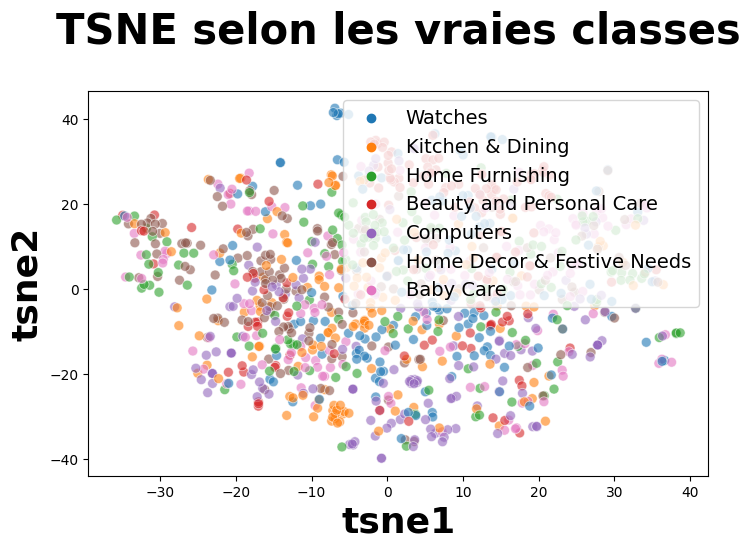

In [ ]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()


## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [ ]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)


(1050, 4)


c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
* Le score ARI de 0.15 reste faible

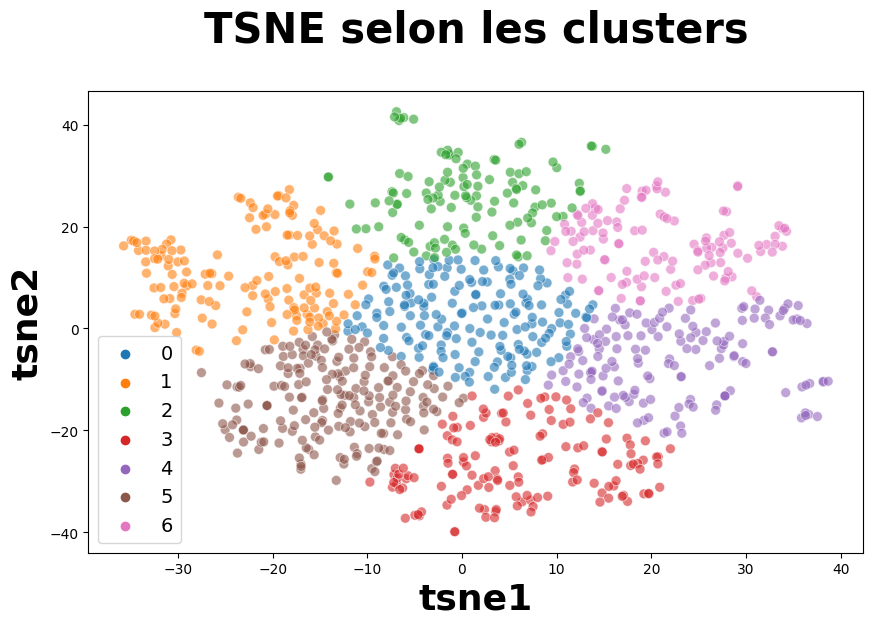

ARI :  0.0368545468599577


In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

### Analyse par classes
* La matrice de confusion doit être transformée pour mettre avoir en colonne le même ordre des catégories supposées qu'en ligne
* Cette transformation atteint ses limites pour les 2 catégories "shine" et "sunshine" qui sont peu séparées (donc elle a été réalisée manuellement au lieu d'utiliser la fonction "argmax")

In [ ]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    173
1    151
2    120
3    147
4    150
5    190
6    119
Name: class, dtype: int64

In [ ]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[22 23  7 15 24 32 27]
 [11 15 42 12 16 17 37]
 [15 11  7 53 24 33  7]
 [25 51  6  7 16 33 12]
 [31 23 21 11 29 20 15]
 [38 19  8 30 12 34  9]
 [31  9 29 19 29 21 12]]


In [ ]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = [22,23,7,15,24,32,27]
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [22, 23, 7, 15, 24, 32, 27]
[[ 0  0  0  0  0  0  0  7 15 22 23 24 27 32]
 [ 0  0  0  0  0  0  0 42 12 11 15 16 37 17]
 [ 0  0  0  0  0  0  0  7 53 15 11 24  7 33]
 [ 0  0  0  0  0  0  0  6  7 25 51 16 12 33]
 [ 0  0  0  0  0  0  0 21 11 31 23 29 15 20]
 [ 0  0  0  0  0  0  0  8 30 38 19 12  9 34]
 [ 0  0  0  0  0  0  0 29 19 31  9 29 12 21]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     150.0
           1       0.00      0.00      0.00     150.0
           2       0.00      0.00      0.00     150.0
           3       0.00      0.00      0.00     150.0
           4       0.00      0.00     

c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(res

In [ ]:
import cv2

def get_descriptors(image, detector):

    #img = cv2.imread(file_path+image, cv2.IMREAD_GRAYSCALE)
    img = cv2.imread(path+image)
    kp, des = detector.detectAndCompute(img, None)


    # returns descriptors of an image
    return des
# Extracting descriptors SIFT
detector = cv2.SIFT_create(600)
dictionary_size = 1049
desc = np.array([])

# desc_src_img is a list which says which image a descriptor belongs to
desc_src_img = []
for i in range(len(list_photos)):
    print('\r', f"{i+1}/{len(list_photos)}", end="")
    img = list_photos[i]
    descriptors = get_descriptors(img, detector)

    if len(desc) == 0:
        desc = np.array(descriptors)
    else:
        desc = np.vstack((desc, descriptors))

    # Keep track of which image a descriptor belongs to
    for j in range(len(descriptors)):
        desc_src_img.append(i)

# important, cv2.kmeans only accepts type32 descriptors
desc = np.float32(desc)

# Clustering
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 0.01)

flags = cv2.KMEANS_PP_CENTERS

# desc is a type32 numpy array of vstacked descriptors
compactness, labels, dictionary = cv2.kmeans(data=desc,K=dictionary_size, bestLabels=None, criteria=criteria, attempts=1, flags=flags)

# Getting histograms from labels
size = labels.shape[0] * labels.shape[1]

imgs_data = [np.zeros((dictionary_size, 1)) for i in range(len(list_photos))]

df["bovw_SIFT"] = ""
for i in range(size):
    label = labels[i]
    # Get this descriptors image id
    img_id = desc_src_img[i]
    # imgs_data is a list of the same size as the number of images
    data_img = imgs_data[img_id]
    # data is a numpy array of size (dictionary_size, 1) filled with zeros
    data_img[label] += 1
    df["bovw_SIFT"][img_id] = data_img.flatten()

 1049/1049

C:\Users\utilisateur\AppData\Local\Temp\ipykernel_14560\1404410568.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["bovw_SIFT"][img_id] = data_img.flatten()


In [ ]:
df['bovw_SIFT']

0       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1       [1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 3.0, 2.0, ...
2       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3       [0.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, ...
4       [0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 4.0, ...
                              ...                        
1045    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 1.0, ...
1046    [3.0, 0.0, 4.0, 1.0, 0.0, 0.0, 3.0, 2.0, 0.0, ...
1047    [0.0, 2.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, ...
1048    [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1049                                                     
Name: bovw_SIFT, Length: 1050, dtype: object

In [ ]:
df.to_csv('cleaned_SIFT.csv')

In [160]:
base_model = VGG16()

x = base_model.layers[-2].output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
pred = Dense(7, activation="softmax")(x)

model = Model(inputs=base_model.inputs, outputs=pred)
for l in model.layers:
    model.trainable = False
    

print(model.summary())

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [161]:
from sklearn import preprocessing

def photo_class(row) :
    file_name = row['uniq_id'] + ".jpg"
    if file_name in list_photos:
        return row['category']
    
df=df.sort_values(by='uniq_id') 
df=df.reset_index()
data = pd.DataFrame()
data["image_path"] = list_photos
data["label_name"] = df.apply(photo_class, axis=1)
le = preprocessing.LabelEncoder()
data["label"] = le.fit_transform(data["label_name"])
data.head()

ValueError: cannot insert level_0, already exists

In [162]:
data.groupby("label").count()

,image_path,label_name
label,,
0,150,150
1,150,150
2,148,148
3,150,150
4,150,150
5,150,150
6,150,150
7,1,0


In [163]:
images_features = []
path_img =  list_photos

i=0
 
for image_file in path_img :
    if i%100 == 0 : print(i)
    i +=1
    image = load_img(image_file, target_size=(224, 224))
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0]) # predict from pretrained model

images_features = np.asarray(images_features)
images_features.shape

0
100
200
300


c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


400
500
600
700
800
900
1000


(1049, 7)

In [164]:
from sklearn import manifold, decomposition

print(images_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(images_features)
print(feat_pca.shape)

(1049, 7)
(1049, 6)


In [165]:
from sklearn import manifold, decomposition
import time

temps1 = time.time()

tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

duration1=time.time()-temps1
print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")

temps de T-SNE :            10.93 secondes


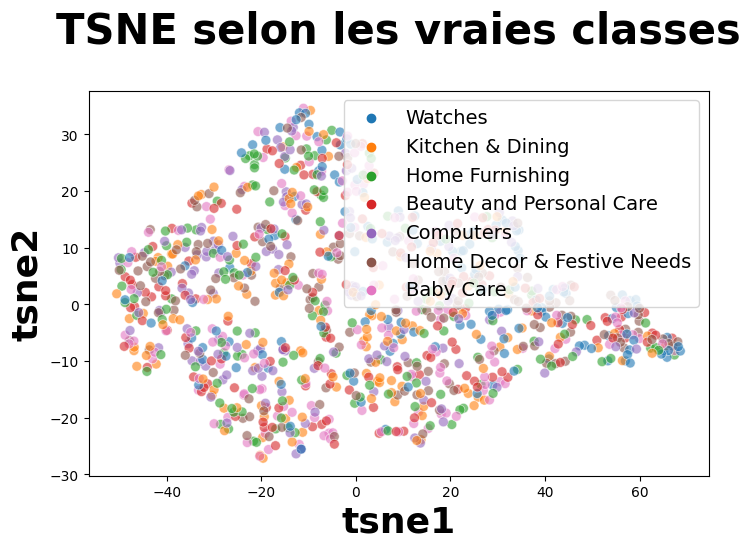

In [166]:
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["label_name"]

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [167]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, n_init=100)
cls.fit(X_tsne)

KMeans(n_clusters=7, n_init=100)

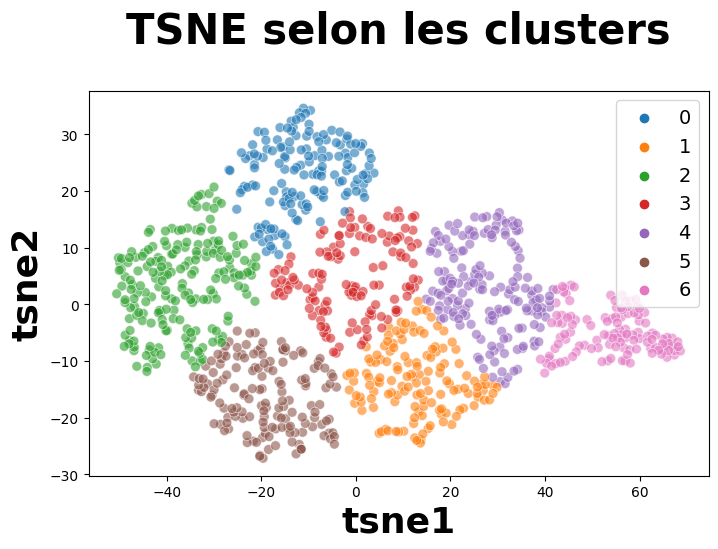

ARI :  0.009899945586839676


In [168]:
df_tsne["cluster"] = cls.labels_

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

In [169]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[26 23 21 18 17 30 15  0]
 [18 20 29 16 24 24 19  0]
 [24 18 37 21 17 26  5  0]
 [13 17 32 25 25 12 26  0]
 [28 21 32 13 19 24 13  0]
 [13 27 32 23 21 25  9  0]
 [26 13 13 17 40 10 31  0]
 [ 0  0  0  0  1  0  0  0]]


In [170]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

In [171]:
cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [4 5 2 3 6 0 6 0]
[[30  0 21 18 26 23 32  0]
 [24  0 29 16 18 20 43  0]
 [26  0 37 21 24 18 22  0]
 [12  0 32 25 13 17 51  0]
 [24  0 32 13 28 21 32  0]
 [25  0 32 23 13 27 30  0]
 [10  0 13 17 26 13 71  0]
 [ 0  0  0  0  0  0  1  0]]

              precision    recall  f1-score   support

           0       0.20      0.20      0.20       150
           1       0.00      0.00      0.00       150
           2       0.19      0.25      0.22       148
           3       0.19      0.17      0.18       150
           4       0.19      0.19      0.19       150
           5       0.19      0.18      0.19       150
           6       0.25      0.47      0.33       150
           7       0.00      0.00      0.00         1

    accuracy                           0.21      1049
   macro avg       0.15      0.18      0.16      1049
weighted avg       0.17      0.21      0.18      1049



c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\utilisateur\environnements\brief_cosmo\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

In [157]:
data

,image_path,label_name,label
0,009099b1f6e1e8f893ec29a7023153c4.jpg,Watches,6
1,0096e89cc25a8b96fb9808716406fe94.jpg,Kitchen & Dining,5
2,00cbbc837d340fa163d11e169fbdb952.jpg,Home Furnishing,4
3,00d84a518e0550612fcfcba3b02b6255.jpg,Beauty and Personal Care,1
4,00e966a5049a262cfc72e6bbf68b80e7.jpg,Computers,2
...,...,...,...
1044,feefbdff924dd6b7cc266449c9a36d69.jpg,Beauty and Personal Care,1
1045,ff24511994fc459d04145231c8876d6c.jpg,Kitchen & Dining,5
1046,ffbf3794aa8cb6bb8d3f313d0a549a09.jpg,Home Furnishing,4
1047,ffc2e1fc7c886ec09a331040ada038aa.jpg,Kitchen & Dining,5
